# <span style="color: red;">Установка пакетов</span>

In [1]:
# using Pkg
# Pkg.add(["Plots", "CSV", "MAT", "DataFrames", "MATLAB", "FileIO", "EzXML", "ImageShow", "Images", "ImageMorphology", "Noise", "ImageBinarization", "ImageDraw", "TickTock"])

In [2]:
using Statistics
using DataFrames
using CSV

struct MetaInfo
    info::Dict{String, String}
end

# <span style="color: red;">Чтение осциллограммы сигнала из *.csv файла</span>

In [3]:
format_ver = 0
# file_name = "../data/6кГц/F0004CH1.CSV"  # 1389
# file_name = "../data/9кГц/F0003CH1.CSV"  # 1390
# file_name = "../data/12кГц/F0002CH1.CSV" # 1387
# file_name = "../data/15кГц/F0001CH1.CSV"  # 1391
file_name = "../data/24кГц/F0000CH1.CSV" # 1392
downsampling_factor = 1;
inx_start = 1  
inx_stop = 2450

# # данные записанные давно (апрель 2018 года)
# format_ver = 1

# # file_name = "../data/old_data/Newfile5.csv"  # 6кГц
# # inx_start = 000_001  
# # inx_stop = 1_400_000

# # file_name = "../data/old_data/Newfile2.csv"  # 9 кГц
# # inx_start = 180_000
# # inx_stop = 1_080_000

# # file_name = "../data/old_data/Newfile1.csv"   # 12 кГц
# # inx_start = 350_000
# # inx_stop = 1_050_000

# # file_name = "../data/old_data/Newfile4.csv" # 15кГц
# # inx_start = 350_000
# # inx_stop = 950_000

# file_name = "../data/old_data/Newfile3.csv" # 24 кГц
# inx_start = 450_000
# inx_stop = 900_000

# # коэффициент понижения частоты дискретизации
# downsampling_factor = 100;

include("load_and_prepare_data.jl")

t, s, meta_info, meta_df, dt, oversampling_factor, N = load_and_prepare_data(file_name, format_ver, inx_start, inx_stop, downsampling_factor);

Считано 2485 отсчётов
Частота дискретизации = 0.0  МГц
15×2 DataFrame
 Row │ Key               Value              
     │ String            String             
─────┼──────────────────────────────────────
   1 │ Pt Fmt            ENV
   2 │ Record Length     2.500000e+03
   3 │ Sample Interval   4.000000e-08
   4 │ Horizontal Units  s
   5 │ Source            CH1
   6 │ Horizontal Scale  1.000000e-05
   7 │ Vertical Offset   0.000000e+00
   8 │ Probe Atten       1.000000e+00
   9 │ Model Number      TDS2002B
  10 │ Trigger Point     7.500000000000e+01
  11 │ Serial Number     C053511
  12 │ Vertical Units    V
  13 │ Vertical Scale    5.000000e-01
  14 │ Yzero             0.000000e+00
  15 │ Firmware Version  FV:v22.16 rus
Для анализа берём 65536 отсчётов

Частота дискретизации (новая) = 25.0  МГц



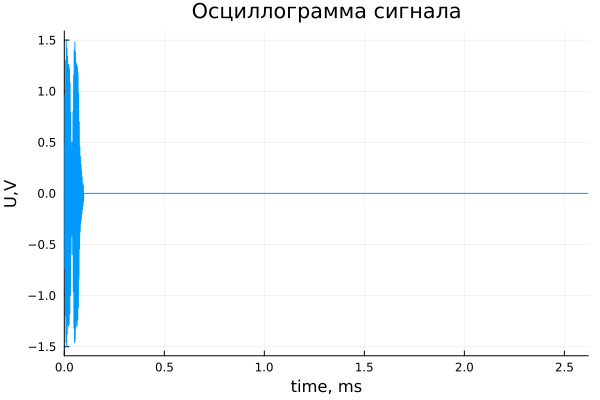

In [4]:
using Plots

plot(t*1000, s, xlabel="time, ms", ylabel="U,V", title="Осциллограмма сигнала", legend=false, grid=true, xlims=(0, t[end]*1000))

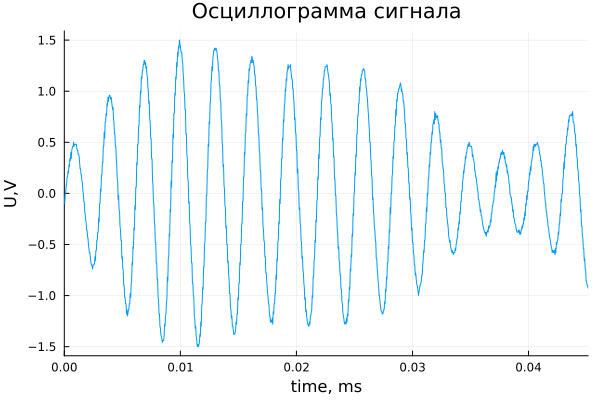

In [5]:
plot(t*1000, s, xlabel="time, ms", ylabel="U,V", title="Осциллограмма сигнала", legend=false, grid=true, xlims=(0, t[end]*1000/oversampling_factor/2.2))

# <span style="color: red;">Спектральный анализ</span>

In [6]:
# Это нужно выполнить, если не установлены необходимые библиотеки
# Pkg.add("DSP")
# Pkg.add("WAV")
# Pkg.add("Base64")
# Pkg.add("FFTW")
# Pkg.add("FindPeaks1D")
# Pkg.add("Statistics")

In [7]:
using DSP, WAV, Base64, FFTW, FindPeaks1D, Statistics

## <span style="color: red;">БПФ (fft)</span>

Применим к сигналу функцию fft(). В результает получем комплексный вектор, который содержит информацию как об амплитуде спектральных составляющих сигнала, так и о фазе.

In [8]:
include("fft_signal.jl")

fft_s, nsamp, fs, df, freq_vec = fft_signal(s, t);

Частота дискретизации = 25.0  МГц
Разрешение по частоте = 381.0  Гц


строи спектр сигнала (fft)

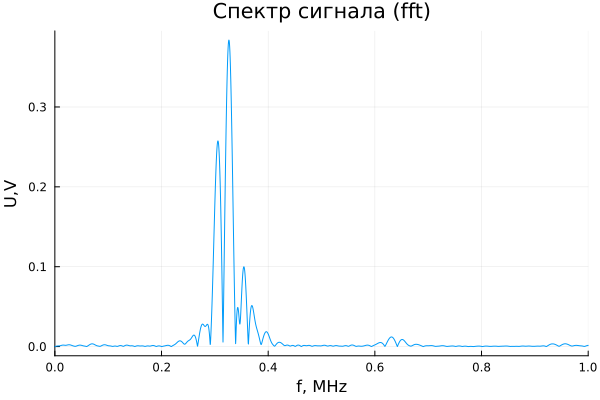

In [9]:
plot(freq_vec/1e6, abs.(fft_s), xlabel="f, MHz", ylabel="U,V", title="Спектр сигнала (fft)", legend=false, xlims=(0, 1))

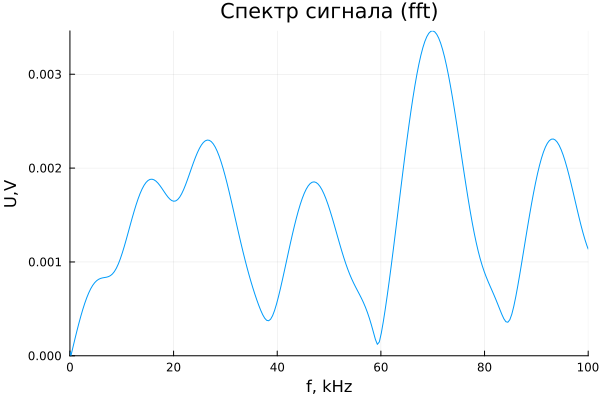

In [10]:
# Выделяем диапазон по x от 0 до 100 кГц
inds = findall(x -> x ≥ 0 && x ≤ 100_000, freq_vec)
max_y = maximum(abs.(fft_s[inds]))

plot(freq_vec/1e3, abs.(fft_s), xlabel="f, kHz", ylabel="U,V", title="Спектр сигнала (fft)", legend=false, xlims=(0, 100), ylims=(0, max_y))

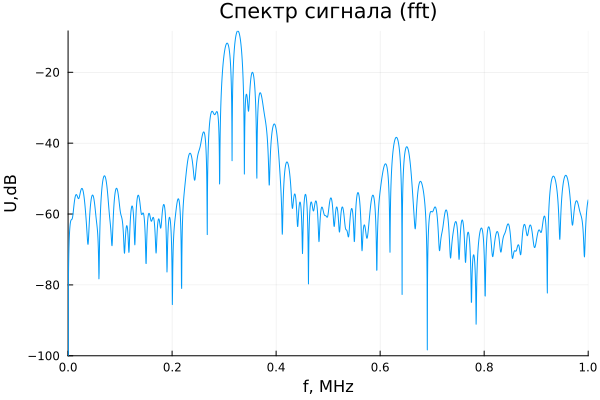

In [11]:
inds = findall(x -> x ≥ 0 && x ≤ 1e6, freq_vec)
max_y = maximum(pow2db.(abs.(fft_s.^2)))

plot(freq_vec/1e6, pow2db.(abs.(fft_s.^2)), xlabel="f, MHz", ylabel="U,dB", title="Спектр сигнала (fft)", legend=false, xlims=(0, 1), ylims=(-100, max_y))

## <span style="color: red;">Периодограмма</span>

**Периодограмма** — это метод оценки **спектральной плотности мощности (СПМ)** сигнала на основе его **дискретного преобразования Фурье (ДПФ)**. На практике вычисляется через **БПФ**.

Алгоритм:

1. Берётся отрезок сигнала (например, 1024 отсчёта).

2. Вычисляется БПФ этого отрезка.

3. Амплитудный спектр возводится в квадрат и нормируется на длину выборки.

4. Получается график мощности по частотам.

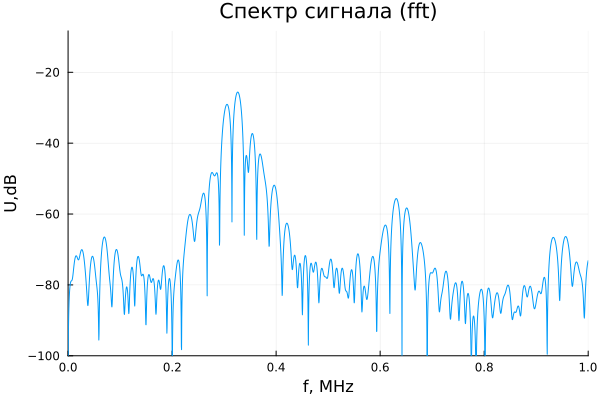

In [12]:
p1 = DSP.periodogram(s, onesided = true, fs = fs, nfft = nsamp);
# max_y = maximum(pow2db.(power(p1)))
plot(freq(p1)/1e6, pow2db.(N*power(p1)), xlabel="f, MHz", ylabel="U,dB", title="Спектр сигнала (fft)", legend=false, xlims=(0, 1), ylims=(-100, max_y))

## <span style="color: red;">Метод Уэлча</span>

Метод Уэлча - это модификация периодограммы, в которой:

* Сигнал разбивается на перекрывающиеся отрезки.

* К каждому отрезку применяется оконная функция (например, Ханна, Хэмминга) - это уменьшает эффект утечки спектра.

* Для каждого отрезка считается периодограмма.

* Результаты усредняются → снижается дисперсия.

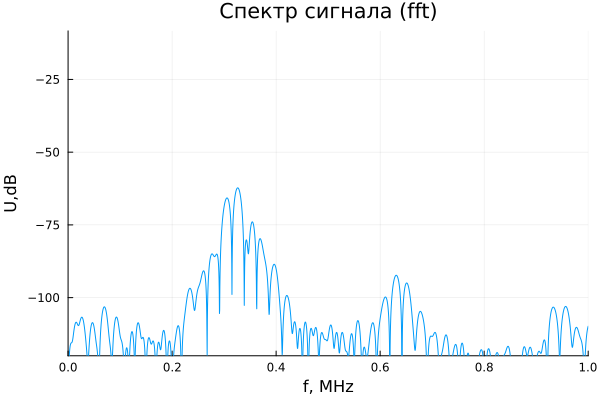

In [13]:
p2 = DSP.welch_pgram(s, onesided = true, fs = fs, nfft = nsamp)
plot(freq(p2)/1e6, pow2db.(power(p2)), xlabel="f, MHz", ylabel="U,dB", title="Спектр сигнала (fft)", legend=false, xlims=(0, 1), ylims=(-120, max_y))

# <span style="color: red;">Определение основной частоты сигнала</span>

Остановимся на оценке спектра методом Уэлча и проанализируем область низких частот (от 0 до 1500 Гц). Найдём **пики** в спектре - они соответствуют гармоникам сигнала. В этом нам поможет функция `findpeaks1d` из соответствующего пакета. Выделим первые шесть гармоник, и отобразим их на графике:

Индексы пиков: [802, 856, 930]
Частоты пиков: [305.5572509765622, 326.15661621093716, 354.38537597656216] кГц
Амплитуды пиков: [-65.74067351880213, -62.27527018571568, -73.9646076112372] дБ


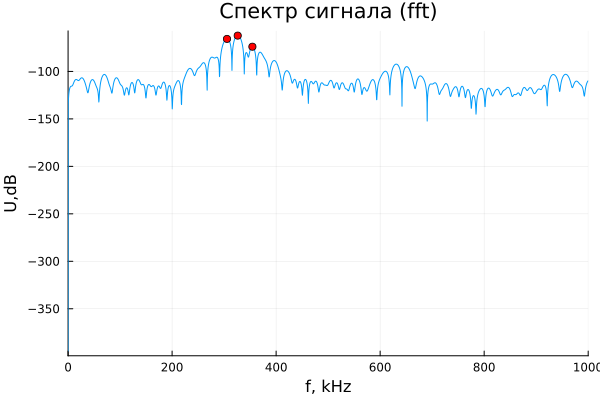

In [14]:
include("plot_peaks_periodogram.jl")

p_test = p2

plot_peaks_periodogram(p_test, freq_limit=1_000_000, height=-75)

Рассмотрим более внимательно спектр сигнала в рабочей области ППФ (в низких частотах)

Индексы пиков: [70, 124, 184, 245]
Частоты пиков: [26.32141113281247, 46.92077636718745, 69.80895996093743, 93.0786132812499] кГц
Амплитуды пиков: [-106.72732534192048, -108.59858777572458, -103.16998278103898, -106.68533525167092] дБ


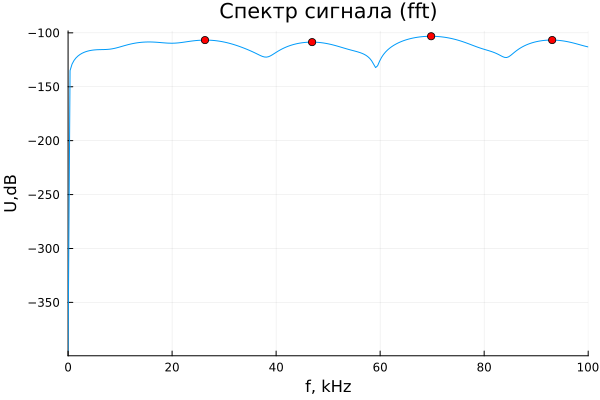

In [15]:
plot_peaks_periodogram(p_test, freq_limit=100_000, height=-120)

# <span style="color: red;">Считывание параметров ЗИ из файла *.dds</span>

Параметры ЗИ записаны в файле *.dds. Формат файла описан руководстве системного программиста [Гидра_DDS.14.pdf (стр.61)](../doc/Гидра_DDS.14.pdf#page=61):

sig1: 0x55aa0f0f
sig2: 0xff00caac
version: 0x100
rec_type: 0x201
size_file: 366
Code_ZI: 1392
Mode: 5
Mode1: 1
TimeZ: 26
NumPrd: 0
TimeR: 77
TimeI: 38
CRC: 0
Prm0: 0
Prm1: 0
Ver: 0
Type: 0
Name_EN: 2 F _ 3 1 5 k H z _ 8 1 u s             
StartFreq: 24000.0
EndFreq: 24000.0
TimeZI: 8.104000000000001e-5
Fs: 78125.0
SampleType: 0
Rzv2: 0
NumCC: 103
Rzv3: 0


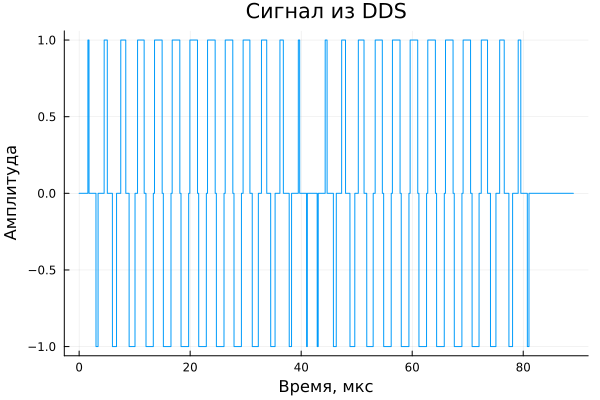

In [16]:
include("reader_dds.jl")

fclk = 125e6  # частота тактирования ЦАП

mode = reader_dds("../ZI/01392.dds", fclk)
print_info(mode)
plot_signal(mode)

### <span style="color: red;">Фильтрация цифрового сигнала</span>

Синтезируем простой эллиптический фильтр нижних частот (ФНЧ), подавляющий частоты выше 360 Гц. Это позволит нам отсечь высшие гармоники. Отфильтруем исходный сигнал и прослушаем результат:

In [17]:
f_cutoff = 1000e3
myfilt = digitalfilter(Lowpass(f_cutoff/fclk), Elliptic(10, 0.1, 60))

# ntaps = 128;
# b = digitalfilter(Lowpass(2*1000e3/fclk), FIRWindow(hanning(ntaps)));
# myfilt = PolynomialRatio(b,[1]);

ZeroPoleGain{:z, ComplexF64, ComplexF64, Float64}(ComplexF64[0.9996393757842669 - 0.02685364745507175im, 0.9996393757842669 + 0.02685364745507175im, 0.9996127036785036 - 0.027828809614355514im, 0.9996127036785036 + 0.027828809614355514im, 0.9995193166695514 - 0.031002187091122863im, 0.9995193166695514 + 0.031002187091122863im, 0.9991290677589875 - 0.04172656179289885im, 0.9991290677589875 + 0.04172656179289885im, 0.9940717965519753 - 0.1087256331318803im, 0.9940717965519753 + 0.1087256331318803im], ComplexF64[0.9993945772164057 - 0.025292315013266793im, 0.9993945772164057 + 0.025292315013266793im, 0.9985784661821686 - 0.024625668599522085im, 0.9985784661821686 + 0.024625668599522085im, 0.9968742475995344 - 0.022651557965228535im, 0.9968742475995344 + 0.022651557965228535im, 0.9936069584588824 - 0.01764088759393589im, 0.9936069584588824 + 0.01764088759393589im, 0.989840306057711 - 0.007115105350965801im, 0.989840306057711 + 0.007115105350965801im], 0.0009829523652490344)

Полезно оценить результат синтеза коэффициентов, визуализировав амплитудно-частотную (АЧХ) и фазо-частотную (ФЧХ) характеристики фильтра, а также его импульсную характеристику:

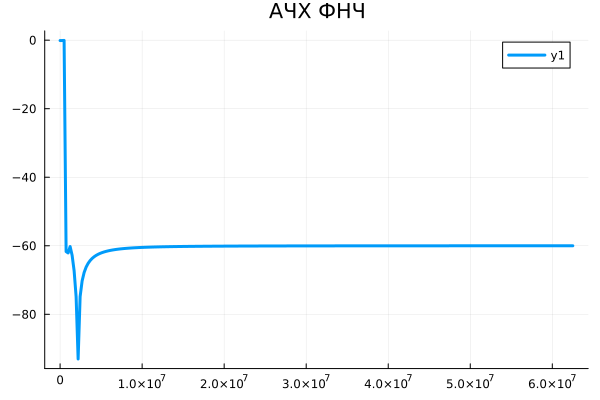

In [18]:
H, w = freqresp(myfilt);

freq_vec = fclk*w/(2*pi);
plot(freq_vec, pow2db.(abs.(H))*2, linewidth=3, title = "АЧХ ФНЧ")

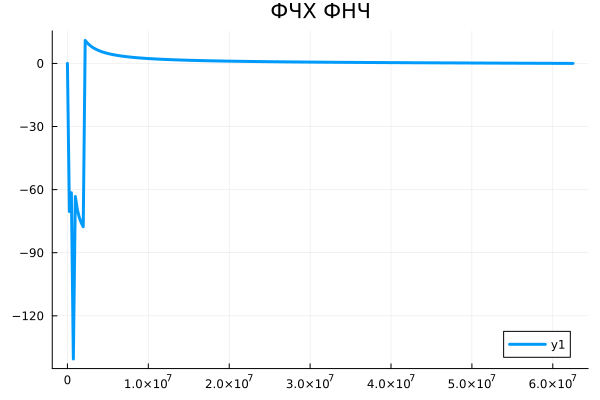

In [19]:
phi, w = phaseresp(myfilt);
plot(freq_vec, rad2deg.(phi/2), linewidth=3, title = "ФЧХ ФНЧ")

Отфильтруем сигнал функцией `filt`, послушаем результат:

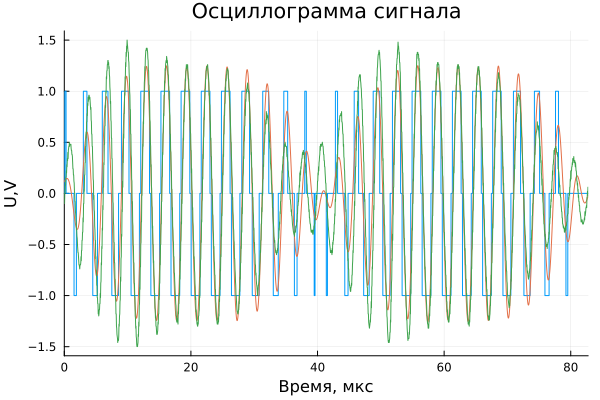

In [20]:
s_after_flt = filt(myfilt, mode.s);

plot(1e6*mode.t .- 1.5, mode.s, xlabel="Время, мкс", ylabel="Амплитуда", title="Сигнал из DDS", legend=false, grid=true)
plot!(1e6*mode.t .- 3, s_after_flt, xlabel="Время, мкс", ylabel="Амплитуда", title="Сигнал после фильтрации", legend=false, grid=true)
plot!(t*1e6, s, xlabel="Время, мкс", ylabel="U,V", title="Осциллограмма сигнала", legend=false, grid=true, xlims=(0, t[end]*1e6/oversampling_factor/1.2))

Сравним спектры исходного и отфильтрованного сигнала:

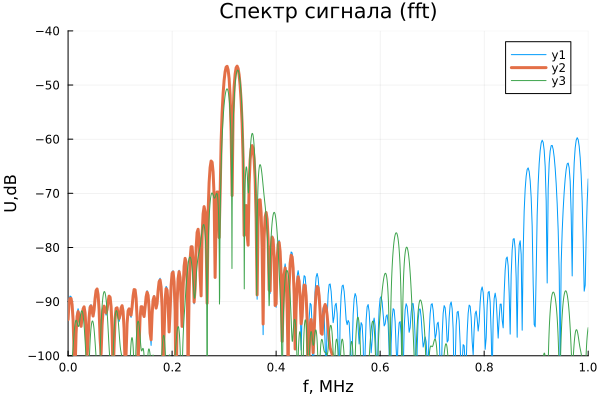

In [21]:
# S = DSP.welch_pgram(mode.s, onesided = true, fs = fclk, nfft = 60000);
# Saf = DSP.welch_pgram(s_after_flt, onesided = true, fs = fclk, nfft = 60000);


S = DSP.periodogram(mode.s, onesided = true, fs = fclk, nfft = 65000);
Saf = DSP.periodogram(s_after_flt, onesided = true, fs = fclk, nfft = 65000);

plot(freq(S)/1e6, pow2db.(power(S)), xlabel="f, MHz", ylabel="U,dB", title="Спектр сигнала (fft)", xlims=(0, 1), ylims=(-100, -40))
plot!(freq(Saf)/1e6, pow2db.(power(Saf)), linewidth = 3)
plot!(freq(p1)/1e6, pow2db.(17*power(p1)), xlabel="f, MHz", ylabel="U,dB", title="Спектр сигнала (fft)", xlims=(0, 1), ylims=(-100, -40))